# Assignment #6: Kernel Methods

## Download and prepare the dataset for training

We will use the Breast Cancer Wisconsin dataset and perform all the necessary preprocessing.

In [1]:
import pandas as pd

In [2]:
breast_cancer = pd.read_csv('data/breast_cancer.csv')
breast_cancer = breast_cancer.drop('id', axis=1)
breast_cancer

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,...,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890,NaN
1,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,...,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902,NaN
2,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,...,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758,NaN
3,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,...,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300,NaN
4,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,...,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,...,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115,NaN
565,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,...,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637,NaN
566,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,...,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820,NaN
567,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,...,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400,NaN


Let's first start by encoding the target column, which is the **diagnosis** (B = no cancer, M = cancer).

In [3]:
breast_cancer['diagnosis'].unique()

array(['M', 'B'], dtype=object)

In [4]:
breast_cancer['diagnosis'] = breast_cancer['diagnosis'].map({'M': 1, 'B': 0})
breast_cancer['diagnosis'].unique()

array([1, 0])

Let's also check if we have some duplicate rows.

In [5]:
breast_cancer[breast_cancer.duplicated()]

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32


Since we don't have any duplicated rows let's continue to the next step and see if there is any missing data.

In [6]:
missing_ratio = breast_cancer.isnull().mean()
missing_ratio = missing_ratio[missing_ratio > 0]
missing_ratio

Unnamed: 32    1.0
dtype: float64

We see that one additional column was generated with all Nan values so we will just remove it.

In [7]:
breast_cancer = breast_cancer.drop('Unnamed: 32', axis=1)
breast_cancer

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,1,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,1,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,1,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,1,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [8]:
breast_cancer.describe()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,0.372583,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,0.483918,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,0.000000,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,0.000000,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,0.000000,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,1.000000,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,1.000000,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


All of the columns have numeric values and we can see that there are variety of features with different ranges. This means that feature scaling would be benefitial, especially because we are planning to use SVM, which is sensitive to the scale of input features.

In [9]:
X = breast_cancer.iloc[:, 1:].values
y = breast_cancer.iloc[:, 0].values

In [10]:
X

array([[1.799e+01, 1.038e+01, 1.228e+02, ..., 2.654e-01, 4.601e-01,
        1.189e-01],
       [2.057e+01, 1.777e+01, 1.329e+02, ..., 1.860e-01, 2.750e-01,
        8.902e-02],
       [1.969e+01, 2.125e+01, 1.300e+02, ..., 2.430e-01, 3.613e-01,
        8.758e-02],
       ...,
       [1.660e+01, 2.808e+01, 1.083e+02, ..., 1.418e-01, 2.218e-01,
        7.820e-02],
       [2.060e+01, 2.933e+01, 1.401e+02, ..., 2.650e-01, 4.087e-01,
        1.240e-01],
       [7.760e+00, 2.454e+01, 4.792e+01, ..., 0.000e+00, 2.871e-01,
        7.039e-02]])

In [11]:
y

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1,
       0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1,
       0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1,
       1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0,
       0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1,
       1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1,

In [12]:
from sklearn.preprocessing import StandardScaler

In [13]:
scaler = StandardScaler()
X = scaler.fit_transform(X)
X

array([[ 1.09706398, -2.07333501,  1.26993369, ...,  2.29607613,
         2.75062224,  1.93701461],
       [ 1.82982061, -0.35363241,  1.68595471, ...,  1.0870843 ,
        -0.24388967,  0.28118999],
       [ 1.57988811,  0.45618695,  1.56650313, ...,  1.95500035,
         1.152255  ,  0.20139121],
       ...,
       [ 0.70228425,  2.0455738 ,  0.67267578, ...,  0.41406869,
        -1.10454895, -0.31840916],
       [ 1.83834103,  2.33645719,  1.98252415, ...,  2.28998549,
         1.91908301,  2.21963528],
       [-1.80840125,  1.22179204, -1.81438851, ..., -1.74506282,
        -0.04813821, -0.75120669]])

Now the data is ready for our model so let's split it into training and test sets.

In [14]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

## Make predictions using SVM with different kernels

Use the Scikit-learn implementation of SVM (SVC() function) to predict if the tumor is malignant or not. Compare and evaluate different:
- kernels.
- regularization parameters.
- gamma values for the RBF kernel.

Find the best values for the parameters and do a grid search (GridSearchCV() function).

In [15]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

In [16]:
param_grid = {
    'C': [0.001, 0.003, 0.006, 0.01, 0.03, 0.06, 0.1, 0.3, 0.6, 1, 10, 100], # Values for regularization param
    'gamma': [0.001, 0.003, 0.006, 0.01, 0.03, 0.06, 0.1, 0.3, 0.6, 1, 10, 100], # gamma values for RBF kernel
    'kernel': ['rbf', 'poly', 'sigmoid', 'linear'] # Different kernels
}

grid_search = GridSearchCV(SVC(), param_grid, verbose=3, cv=5)
grid_search.fit(X_train, y_train)

Fitting 5 folds for each of 576 candidates, totalling 2880 fits
[CV 1/5] END ..C=0.001, gamma=0.001, kernel=rbf;, score=0.637 total time=   0.0s
[CV 2/5] END ..C=0.001, gamma=0.001, kernel=rbf;, score=0.626 total time=   0.0s
[CV 3/5] END ..C=0.001, gamma=0.001, kernel=rbf;, score=0.626 total time=   0.0s
[CV 4/5] END ..C=0.001, gamma=0.001, kernel=rbf;, score=0.626 total time=   0.0s
[CV 5/5] END ..C=0.001, gamma=0.001, kernel=rbf;, score=0.626 total time=   0.0s
[CV 1/5] END .C=0.001, gamma=0.001, kernel=poly;, score=0.637 total time=   0.0s
[CV 2/5] END .C=0.001, gamma=0.001, kernel=poly;, score=0.626 total time=   0.0s
[CV 3/5] END .C=0.001, gamma=0.001, kernel=poly;, score=0.626 total time=   0.0s
[CV 4/5] END .C=0.001, gamma=0.001, kernel=poly;, score=0.626 total time=   0.0s
[CV 5/5] END .C=0.001, gamma=0.001, kernel=poly;, score=0.626 total time=   0.0s
[CV 1/5] END C=0.001, gamma=0.001, kernel=sigmoid;, score=0.637 total time=   0.0s
[CV 2/5] END C=0.001, gamma=0.001, kernel=s

GridSearchCV(cv=5, estimator=SVC(),
             param_grid={'C': [0.001, 0.003, 0.006, 0.01, 0.03, 0.06, 0.1, 0.3,
                               0.6, 1, 10, 100],
                         'gamma': [0.001, 0.003, 0.006, 0.01, 0.03, 0.06, 0.1,
                                   0.3, 0.6, 1, 10, 100],
                         'kernel': ['rbf', 'poly', 'sigmoid', 'linear']},
             verbose=3)

In [17]:
# Convert grid search results to a DataFrame
results = pd.DataFrame(grid_search.cv_results_)

# Focus on relevant columns
relevant_columns = ['param_C', 'param_gamma', 'param_kernel', 'mean_test_score']
results = results[relevant_columns]
results

,param_C,param_gamma,param_kernel,mean_test_score
0,0.001,0.001,rbf,0.628571
1,0.001,0.001,poly,0.628571
2,0.001,0.001,sigmoid,0.628571
3,0.001,0.001,linear,0.934066
4,0.001,0.003,rbf,0.628571
...,...,...,...,...
571,100,10,linear,0.951648
572,100,100,rbf,0.628571
573,100,100,poly,0.949451
574,100,100,sigmoid,0.881319


Now let's plot heatmap for the RBF kernel to see how different values of the regularization level and gamma parameter influence the model.

In [18]:
import seaborn as sns
import matplotlib.pyplot as plt

<ipython-input-19-ac8f7799708b>:5: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  pivot_table = rbf_results.pivot('param_C', 'param_gamma', 'mean_test_score')
<ipython-input-19-ac8f7799708b>:5: FutureWarning: In a future version, the Index constructor will not infer numeric dtypes when passed object-dtype sequences (matching Series behavior)
  pivot_table = rbf_results.pivot('param_C', 'param_gamma', 'mean_test_score')
<ipython-input-19-ac8f7799708b>:5: FutureWarning: In a future version, the Index constructor will not infer numeric dtypes when passed object-dtype sequences (matching Series behavior)
  pivot_table = rbf_results.pivot('param_C', 'param_gamma', 'mean_test_score')


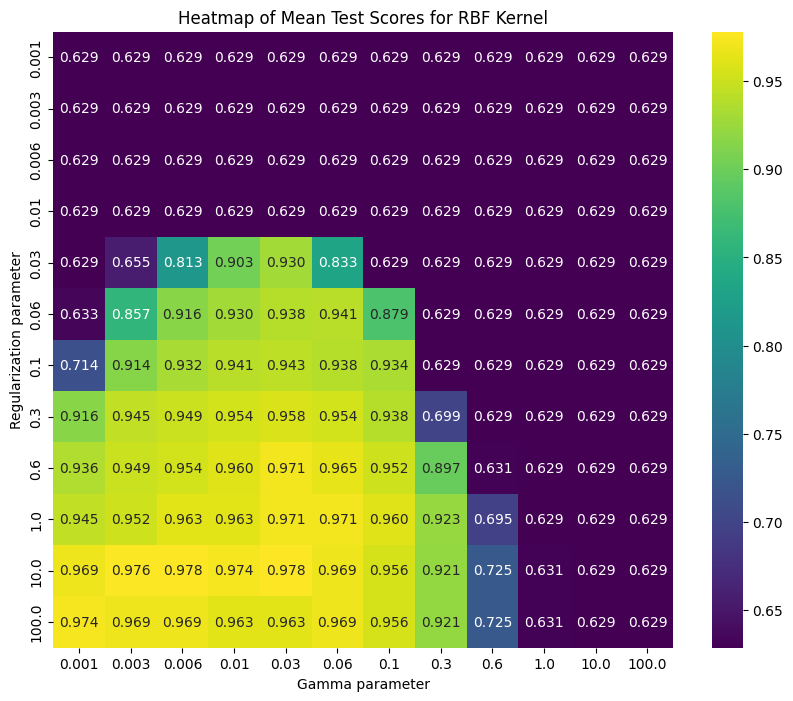

In [19]:
# Filter results for the RBF kernel
rbf_results = results[results['param_kernel'] == 'rbf']

# Pivot the data to create a matrix form suitable for heatmap plotting
pivot_table = rbf_results.pivot('param_C', 'param_gamma', 'mean_test_score')

# Create the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(pivot_table, annot=True, fmt=".3f", cmap='viridis')
plt.title("Heatmap of Mean Test Scores for RBF Kernel")
plt.xlabel("Gamma parameter")
plt.ylabel("Regularization parameter")
plt.show()

From the heatmap we can see that the minimum score is 0.629 and is achieved using values for the regularization parameter from 0.001 until 0.06 and gamma parameter from 1 forward. Using smaller gamma parameter and bigger regularization parameter seems to increase a lot the score. The best score is achieved for regularization parameter **10** and gamma parameter **0.006** and **0.03** and is 0.978.

For the other kernels we will just plot the results since the gamma parameter doesn't influence them.

<ipython-input-20-76bef00c9075>:6: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=non_rbf_kernels, x='param_C', y='mean_test_score', hue='param_kernel', marker='o', ci=None)


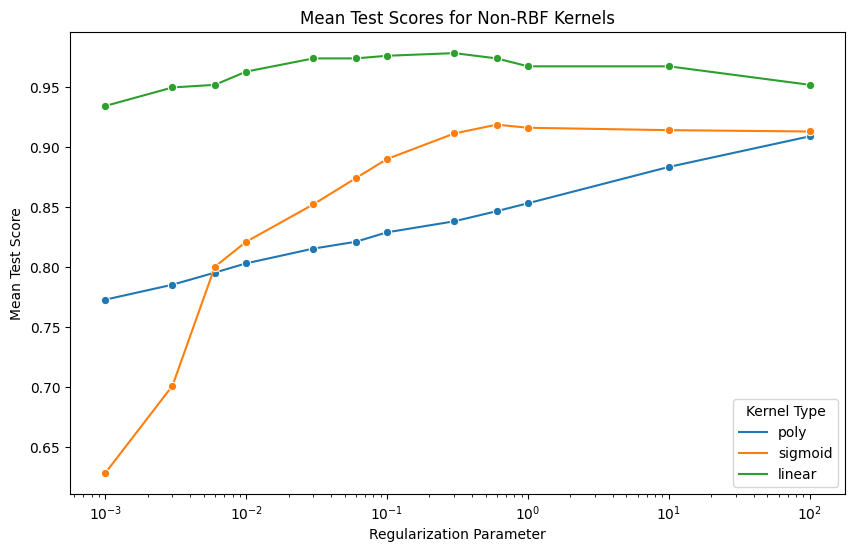

In [20]:
# Filter results for non-RBF kernels
non_rbf_kernels = results[results['param_kernel'] != 'rbf']

# Plotting
plt.figure(figsize=(10, 6))
sns.lineplot(data=non_rbf_kernels, x='param_C', y='mean_test_score', hue='param_kernel', marker='o', ci=None)

plt.title("Mean Test Scores for Non-RBF Kernels")
plt.xlabel("Regularization Parameter")
plt.ylabel("Mean Test Score")
plt.xscale('log')
plt.legend(title='Kernel Type')
plt.show()

We can see here that for the other kernels the linear gives better results in general than the other two. For the Polynomial kernel we can see that there is some linear increasing and more the regularization level is increased, better result we get. The maximum score seems to be around 0.9. The Sigmoid kernel starts with worse score for the smaller regularization level, but faster increases the score than the polynomial. It reaches its maximum at 0.6 and has score a bit higher than 0.9. The Linear kernel on other hand always has score higher than 0.9 and seems to reach its maximum for regularization parameter with value 0.3, which is around **0.98**. This seems to be similar to the score achieved with RBF's best parameters.

Now let's see which are the best parameters for real.

In [21]:
print("Best parameters found:", grid_search.best_params_)
print("Best score:", grid_search.best_score_)

Best parameters found: {'C': 0.3, 'gamma': 0.001, 'kernel': 'linear'}
Best score: 0.9780219780219781


The best score of **0.978** seems to be achieved using the **Linear** kernel, and the regularization level **0.3**. As we already saw, this result can be achieve also using the **RBF** kernel with regularization level **10** and gamma parameter **0.006** or **0.03**. Let's train 3 models using these different parameters and see how they perform on the test set.

## Test the models

Now let's train the model using the best parameters and evaluate it using our test set.

In [22]:
model_linear_kernel = SVC(C=0.3, kernel='linear', gamma=0.001).fit(X_train, y_train)
model_rbf_kernel_1 = SVC(C=10, kernel='rbf', gamma=0.006).fit(X_train, y_train)
model_rbf_kernel_2 = SVC(C=10, kernel='rbf', gamma=0.03).fit(X_train, y_train)

Now let's evaluate and compare our models using Accuracy, Recall, Precision, F1-Score and AUC.

In [23]:
from sklearn.metrics import roc_curve, auc

In [24]:
models = [model_linear_kernel, model_rbf_kernel_1, model_rbf_kernel_2]
model_names = ['Linear Kernel Model', 'RBF Kernel Model 1', 'RBF Kernel Model 2']
comparison_metrics = []
curve_metrics = []

for model, name in zip(models, model_names):
  # Make predictions
  y_pred = model.predict(X_test)
  y_scores = model.decision_function(X_test)

  # Calculate TP, TN, FP, FN
  tp = sum((y_test == 1) & (y_pred == 1))
  tn = sum((y_test == 0) & (y_pred == 0))
  fp = sum((y_test == 0) & (y_pred == 1))
  fn = sum((y_test == 1) & (y_pred == 0))

  # Calculate the metrics
  accuracy = (tp + tn) / (tp + tn + fp + fn)
  precision = tp / (tp + fp) if (tp + fp) > 0 else 0
  recall = tp / (tp + fn) if (tp + fn) > 0 else 0
  f1_score = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
  fpr, tpr, thresholds = roc_curve(y_test, y_scores)
  roc_auc = auc(fpr, tpr)

  comparison_metrics.append({
    'Accuracy': accuracy,
    'Precision': precision,
    'Recall': recall,
    'F1-Score': f1_score
  })
  curve_metrics.append({
    'FPR': fpr,
    'TPR': tpr,
    'Thresholds': thresholds,
    'AUC': roc_auc
  })

In [25]:
import numpy as np

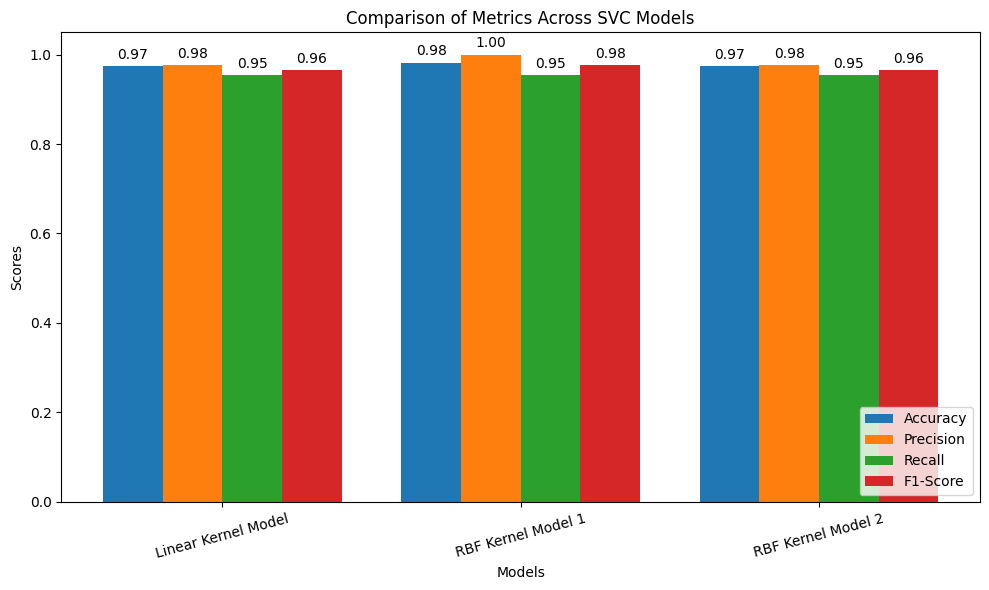

In [26]:
metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score']

fig, ax = plt.subplots(figsize=(10, 6))

bar_width = 0.2
index = np.arange(len(model_names))

for i, metric in enumerate(metrics):
    values = [m[metric] for m in comparison_metrics]
    bars = ax.bar(index + i * bar_width, values, bar_width, label=metric)

    for bar, value in zip(bars, values):
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.01, f'{value:.2f}', ha='center', va='bottom')


ax.set_xlabel('Models')
ax.set_ylabel('Scores')
ax.set_title('Comparison of Metrics Across SVC Models')
ax.set_xticks(index + bar_width * (len(metrics) - 1) / 2)
ax.set_xticklabels(model_names, rotation=15)

ax.legend(loc='lower right')
plt.tight_layout()
plt.show()

From the results we can see that the SVM model that is using the RBF kernel with gamma parameter 0.006, gives the best results (slightly better than the others) for almost every metric. Let's also visualize the ROC curves and compare the AUC of each model.

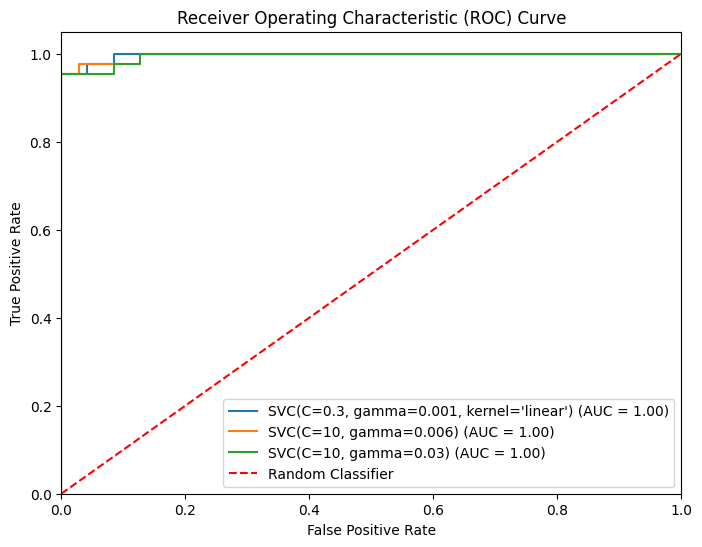

In [27]:
plt.figure(figsize=(8, 6))

for model_name, curve_metric in zip(models, curve_metrics):
    fpr = curve_metric['FPR']
    tpr = curve_metric['TPR']
    roc_auc = curve_metric['AUC']
    plt.plot(fpr, tpr, label=f'{model_name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], '--', label='Random Classifier', color='red')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")

plt.show()

Also in this plot we can see that all modes seems to have pretty much the same AUC, but the SVM model with the RBF kernel and gamma parameter 0.006 seems to have high TPR relatively early in comparison with the other two, while the linear seems to achieve the highest TPR first.

## Implement kernel regression model from scratch

Train and test your kernel regression model:
- Implement at least 3 different kernel functions.
- Compute the kernel matrix.
- Compute alpha = K^{-1}y to get the model coefficients in the multidimensional space.
- Compute predictions for the test point z: y(z) = k*alpha, where k is the kernel(vector) of the test points with the training points. k(z) = [k(z, x_0), ..., k(z, x_n)]

In [28]:
class KernelRegression:
  def __init__(self, kernel='linear', gamma=1.0, degree=2, reg_lvl=1e-5):
    self.kernel = kernel
    self.gamma = gamma
    self.degree = degree
    self.reg_lvl = reg_lvl
    self.X_train = None
    self.alpha = None
    self.means = None
    self.stds = None


  def kernel_function(self, x, z):
    if self.kernel == 'linear':
      return np.dot(x, z)
    elif self.kernel == 'polynomial':
      return (1 + np.dot(x, z)) ** self.degree
    elif self.kernel == 'rbf':
      return np.exp(-np.square(np.linalg.norm(x - z)) / (2 * np.square(self.gamma)))


  def fit(self, X, y):
    # Standardize the data
    self.means = np.mean(X, axis=0)
    self.stds = np.std(X, axis=0)
    X = np.divide(np.subtract(X, self.means), self.stds)
    self.X_train = X

    # Compute the Kernel matrix
    n_samples = X.shape[0]
    K = np.zeros((n_samples, n_samples))
    for i in range(n_samples):
      for j in range(n_samples):
        K[i, j] = self.kernel_function(X[i], X[j])

    # Regularized Kernel matrix (In case of non-invertable)
    K_reg = K + self.reg_lvl * np.eye(n_samples)

    # Compute alpha to get the coefficients in multidimensional space
    self.alpha = np.linalg.solve(K_reg, y)


  def predict(self, X):
    # Check if the model is already trained (coefficients are calculated)
    if self.alpha is None:
      raise ValueError("Model has not been trained yet. Call the function 'fit()' first")

    # Standardize the training data
    X = np.divide(np.subtract(X, self.means), self.stds)
    predictions = []
    for z in X:
      k_z = np.array([self.kernel_function(x, z) for x in self.X_train])
      predictions.append(np.dot(k_z, self.alpha))

    return predictions


  def evaluate(self, y_true, y_pred):
    # Calculate the MSE
    mse = np.square(np.subtract(y_true, y_pred)).mean()
    # Calculate the MAE
    mae = np.abs(np.subtract(y_true, y_pred)).mean()
    # Calculate the RSE
    rss = np.square(np.subtract(y_true, y_pred)).sum()
    rse = np.sqrt(rss / (len(y_true) - 2))
    # Calculate the R^2
    tss = np.square(np.subtract(y_true, y_true.mean())).sum()
    r2_score = 1 - np.divide(rss, tss)

    return mse, mae, rse, r2_score

## Dowload and preprocess the data

In [29]:
df = pd.read_csv('data/kernel_regression.csv', index_col=0)
df

,x,y
1,1.00,25.882522
2,1.25,21.573761
3,1.50,18.780320
4,1.75,17.122230
5,2.00,15.616773
...,...,...
193,49.00,143.968542
194,49.25,145.224493
195,49.50,146.653436
196,49.75,146.250501


 Let's see if we have any duplicate values.

In [30]:
df[df.duplicated()]

,x,y


Since we don't have duplicates, let's also check for missing data.

In [31]:
missing_ratio = df.isnull().mean()
missing_ratio = missing_ratio[missing_ratio > 0]
missing_ratio

Series([], dtype: float64)

It seems that everything is okay. Let's now apply feature scaling and prepare the splits so we could train and test our implementation of the kernel regression.

In [32]:
X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

In [33]:
X[:5]

array([[1.  ],
       [1.25],
       [1.5 ],
       [1.75],
       [2.  ]])

In [34]:
y[:5]

array([25.88252244, 21.57376127, 18.78031989, 17.12222967, 15.61677341])

In [35]:
scaler = StandardScaler()
X = scaler.fit_transform(X)
X[:3]

array([[-1.72328087],
       [-1.70569637],
       [-1.68811188]])

In [36]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

## Plot the data and your predictions

Now let's see how different parameters change the performance of our implementation.

In [37]:
kernels = ['linear', 'polynomial', 'rbf']
gammas = [0.001, 0.003, 0.006, 0.01, 0.03, 0.06, 0.1, 0.3, 0.6, 1, 10, 100]
reg_lvls = [0.001, 0.003, 0.006, 0.01, 0.03, 0.06, 0.1, 0.3, 0.6, 1]
degrees = [2, 3, 4]

In [38]:
from tqdm import tqdm

In [39]:
results = []

for kernel in tqdm(kernels, desc='Kernels'):
  for gamma in gammas:
    for reg_lvl in reg_lvls:
      for degree in degrees:
        model = KernelRegression(kernel=kernel, gamma=gamma, degree=degree, reg_lvl=reg_lvl)
        model.fit(X_train, y_train)

        y_pred = model.predict(X_test)
        mse, mae, rse, r2 = model.evaluate(y_test, y_pred)
        results.append({
            'Kernel': kernel,
            'Gamma': gamma,
            'Regularization lvl': reg_lvl,
            'Degree': degree,
            'MSE': mse,
            'MAE': mae,
            'RSE': rse,
            'R2': r2
        })

Kernels: 100%|██████████| 3/3 [04:15<00:00, 85.20s/it]


In [40]:
results_df = pd.DataFrame(results)
results_df

,Kernel,Gamma,Regularization lvl,Degree,MSE,MAE,RSE,R2
0,linear,0.001,0.001,2,3956.299550,62.045144,64.533138,-2.150722
1,linear,0.001,0.001,3,3956.299550,62.045144,64.533138,-2.150722
2,linear,0.001,0.001,4,3956.299550,62.045144,64.533138,-2.150722
3,linear,0.001,0.003,2,3956.299138,62.045145,64.533134,-2.150721
4,linear,0.001,0.003,3,3956.299138,62.045145,64.533134,-2.150721
...,...,...,...,...,...,...,...,...
1075,rbf,100.000,0.600,3,1196.773517,29.468446,35.493120,0.046912
1076,rbf,100.000,0.600,4,1196.773517,29.468446,35.493120,0.046912
1077,rbf,100.000,1.000,2,1219.830401,29.735115,35.833392,0.028550
1078,rbf,100.000,1.000,3,1219.830401,29.735115,35.833392,0.028550


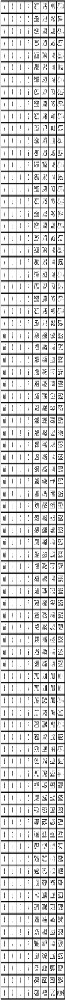

In [41]:
fig, ax = plt.subplots(figsize=(15, 10))
ax.axis('tight')
ax.axis('off')
ax.table(cellText=results_df.values, colLabels=results_df.columns, cellLoc = 'center', loc='center')

plt.show()

We see that for most cases we use linear kernel, we don't have very good results, but for the other two kernels this is not the case. Let's check the mean results for each metric from each parameter.

In [42]:
results_df.groupby('Kernel').mean().iloc[:, 3:]

,MSE,MAE,RSE,R2
Kernel,,,,
linear,3956.263414,62.045278,64.532843,-2.150693
polynomial,39.473006,5.580131,6.445943,0.968564
rbf,1590.358243,24.100245,28.657069,-0.266531


As we have already established, we get the worst results, when using the linear kernel and the best when using the polynomial. RBF kernel seems to give us mean result somewhere in between.

In [43]:
results_df.groupby('Gamma').mean().iloc[:, 2:]

<ipython-input-43-f23fbfa11c2a>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  results_df.groupby('Gamma').mean().iloc[:, 2:]


,MSE,MAE,RSE,R2
Gamma,,,,
0.001,3037.837071,43.257054,48.125289,-1.419276
0.003,3037.836830,43.257052,48.125287,-1.419276
0.006,2971.120737,42.864463,47.641927,-1.366144
0.010,2289.219092,38.112074,41.954736,-0.823091
0.030,1379.122476,24.994944,27.045880,-0.098307
0.060,1339.270863,23.486473,24.805045,-0.066570
0.100,1336.213616,23.493808,24.796733,-0.064135
0.300,1342.010263,24.087235,25.485466,-0.068751
0.600,1345.307122,24.430092,25.827424,-0.071377


Increasing the gamma value seem to give us better results until the value of 10. Afterwards the scores are starting to get worse again.

In [44]:
results_df.groupby('Regularization lvl').mean().iloc[:, 2:]

<ipython-input-44-056358b1c6cd>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  results_df.groupby('Regularization lvl').mean().iloc[:, 2:]


,MSE,MAE,RSE,R2
Regularization lvl,,,,
0.001,1832.020105,29.848802,32.345327,-0.458986
0.003,1833.006573,29.883960,32.412242,-0.459772
0.006,1835.161880,29.956155,32.520603,-0.461488
0.010,1838.194319,30.064979,32.642027,-0.463903
0.030,1849.396617,30.366743,32.968647,-0.472824
0.060,1858.209272,30.549138,33.175000,-0.479843
0.100,1864.943510,30.684431,33.327379,-0.485206
0.300,1883.089386,31.049739,33.758466,-0.499657
0.600,1902.310873,31.448633,34.228539,-0.514964


For the regression level we see the opposite tendency. Lower values give us better performance.

In [45]:
results_df.groupby('Degree').mean().iloc[:, 2:]

<ipython-input-45-ef38934bf020>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  results_df.groupby('Degree').mean().iloc[:, 2:]


,MSE,MAE,RSE,R2
Degree,,,,
2,1862.025888,30.576764,33.211490,-0.482882
3,1862.057750,30.574604,33.214085,-0.482907
4,1862.011025,30.574287,33.210280,-0.482870


The degree, which is only used with the polynomial kernel, don't seem to improve much the performance of our model.

Now let's see, which are the combinations of parameters that give us the best and the worse performance for each of the kernels.

In [46]:
# Group by kernel type
grouped = results_df.groupby('Kernel')
metrics = ['MSE', 'MAE', 'RSE', 'R2']

# Initialize dictionaries to store best and worst parameters for each kernel
best_params_by_kernel = {}
worst_params_by_kernel = {}

for kernel, group in grouped:
  print(f"--- Kernel: {kernel} ---")
  for metric in metrics:
    if metric == 'R2':
      best_idx = group[metric].idxmax()
      worst_idx = group[metric].idxmin()
    else:
      best_idx = group[metric].idxmin()
      worst_idx = group[metric].idxmax()

    print(f"- Metric: {metric}")
    print("Best Parameters:\n", group.loc[best_idx])
    print("Worst Parameters:\n", group.loc[worst_idx])
    print("\n")

--- Kernel: linear ---
- Metric: MSE
Best Parameters:
 Kernel                     linear
Gamma                       0.001
Regularization lvl            1.0
Degree                          2
MSE                   3956.142479
MAE                      62.04578
RSE                     64.531857
R2                      -2.150597
Name: 27, dtype: object
Worst Parameters:
 Kernel                    linear
Gamma                      0.001
Regularization lvl         0.001
Degree                         2
MSE                   3956.29955
MAE                    62.045144
RSE                    64.533138
R2                     -2.150722
Name: 0, dtype: object


- Metric: MAE
Best Parameters:
 Kernel                    linear
Gamma                      0.001
Regularization lvl         0.001
Degree                         2
MSE                   3956.29955
MAE                    62.045144
RSE                    64.533138
R2                     -2.150722
Name: 0, dtype: object
Worst Parameters:
 Ker

From the results we can make the following conclusions:
- For the **Linear** Kernel the best performance seems to be achieved when using gamma **0.001** and regularization level **0.003**. Sadly these parameters seem to give performance pretty close to the worst one.
- The **Polynomial** Kernel on the other hand has good performance even for its worst case. The best parameters seem to be achieved, when using gamma **0.001**, regularization level **0.001** and degree **2**.
- The last kernel is the **RBF/Gaussian**, which also has pretty good performance. The best scores are achieved using the gamma **0.06** and regularization level **0.01**.

Looking at the performance now, the best performance is achieved using the RBF kernel.

Now let's train our best models, compare their scores and plot their predictions.

In [52]:
model_linear = KernelRegression(kernel='linear', gamma=0.001, reg_lvl=0.003)
model_linear.fit(X_train, y_train)

model_polynomial = KernelRegression(kernel='polynomial', gamma=0.001, degree=2, reg_lvl=0.001)
model_polynomial.fit(X_train, y_train)

model_rbf = KernelRegression(kernel='rbf', gamma=0.06, reg_lvl=0.01)
model_rbf.fit(X_train, y_train)

In [57]:
y_pred_linear_test = model_linear.predict(X_test)
y_pred_linear_train = model_linear.predict(X_train)
mse_linear, mae_linear, rse_linear, r2_linear = model_linear.evaluate(y_test, y_pred_linear_test)

y_pred_polynomial_test = model_polynomial.predict(X_test)
y_pred_polynomial_train = model_polynomial.predict(X_train)
mse_polynomial, mae_polynomial, rse_polynomial, r2_polynomial = model_polynomial.evaluate(y_test, y_pred_polynomial_test)

y_pred_rbf_test = model_rbf.predict(X_test)
y_pred_rbf_train = model_rbf.predict(X_train)
mse_rbf, mae_rbf, rse_rbf, r2_rbf = model_rbf.evaluate(y_test, y_pred_rbf_test)

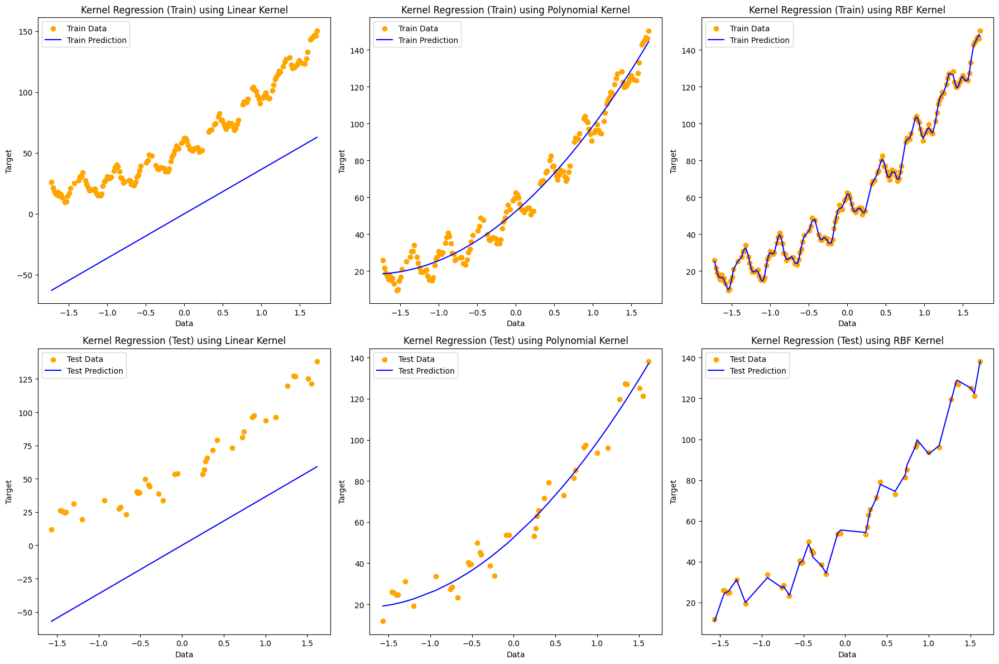

In [58]:
sorted_indices = np.argsort(X_train, axis=0).flatten()
X_train_sorted = X_train[sorted_indices]
y_train_sorted = y_train[sorted_indices]
y_pred_linear_sorted_train = np.array(y_pred_linear_train)[sorted_indices]
y_pred_polynomial_sorted_train = np.array(y_pred_polynomial_train)[sorted_indices]
y_pred_rbf_sorted_train = np.array(y_pred_rbf_train)[sorted_indices]

sorted_indices = np.argsort(X_test, axis=0).flatten()
X_test_sorted = X_test[sorted_indices]
y_test_sorted = y_test[sorted_indices]
y_pred_linear_sorted_test = np.array(y_pred_linear_test)[sorted_indices]
y_pred_polynomial_sorted_test = np.array(y_pred_polynomial_test)[sorted_indices]
y_pred_rbf_sorted_test = np.array(y_pred_rbf_test)[sorted_indices]


fig, axs = plt.subplots(2, 3, figsize=(18, 12))

# Plot for Linear Kernel (Training Set)
axs[0, 0].scatter(X_train_sorted, y_train_sorted, color='orange', label='Train Data')
axs[0, 0].plot(X_train_sorted, y_pred_linear_sorted_train, color='blue', label='Train Prediction')
axs[0, 0].set_title('Kernel Regression (Train) using Linear Kernel')
axs[0, 0].set_xlabel('Data')
axs[0, 0].set_ylabel('Target')
axs[0, 0].legend()

# Plot for Polynomial Kernel (Training Set)
axs[0, 1].scatter(X_train_sorted, y_train_sorted, color='orange', label='Train Data')
axs[0, 1].plot(X_train_sorted, y_pred_polynomial_sorted_train, color='blue', label='Train Prediction')
axs[0, 1].set_title('Kernel Regression (Train) using Polynomial Kernel')
axs[0, 1].set_xlabel('Data')
axs[0, 1].set_ylabel('Target')
axs[0, 1].legend()

# Plot for RBF Kernel (Training Set)
axs[0, 2].scatter(X_train_sorted, y_train_sorted, color='orange', label='Train Data')
axs[0, 2].plot(X_train_sorted, y_pred_rbf_sorted_train, color='blue', label='Train Prediction')
axs[0, 2].set_title('Kernel Regression (Train) using RBF Kernel')
axs[0, 2].set_xlabel('Data')
axs[0, 2].set_ylabel('Target')
axs[0, 2].legend()

# Plot for Linear Kernel (Test Set)
axs[1, 0].scatter(X_test_sorted, y_test_sorted, color='orange', label='Test Data')
axs[1, 0].plot(X_test_sorted, y_pred_linear_sorted_test, color='blue', label='Test Prediction')
axs[1, 0].set_title('Kernel Regression (Test) using Linear Kernel')
axs[1, 0].set_xlabel('Data')
axs[1, 0].set_ylabel('Target')
axs[1, 0].legend()

# Plot for Polynomial Kernel (Test Set)
axs[1, 1].scatter(X_test_sorted, y_test_sorted, color='orange', label='Test Data')
axs[1, 1].plot(X_test_sorted, y_pred_polynomial_sorted_test, color='blue', label='Test Prediction')
axs[1, 1].set_title('Kernel Regression (Test) using Polynomial Kernel')
axs[1, 1].set_xlabel('Data')
axs[1, 1].set_ylabel('Target')
axs[1, 1].legend()

# Plot for RBF Kernel (Test Set)
axs[1, 2].scatter(X_test_sorted, y_test_sorted, color='orange', label='Test Data')
axs[1, 2].plot(X_test_sorted, y_pred_rbf_sorted_test, color='blue', label='Test Prediction')
axs[1, 2].set_title('Kernel Regression (Test) using RBF Kernel')
axs[1, 2].set_xlabel('Data')
axs[1, 2].set_ylabel('Target')
axs[1, 2].legend()

plt.tight_layout()
plt.show()

On the plots we can clearly see that the Polynomial and RBF kernels help us catch the non-linearity between the feature and the target attribute. The RBF line seems to be a bit more adapted than the Polynomial one, which was expected, because of the higher performance of the model.

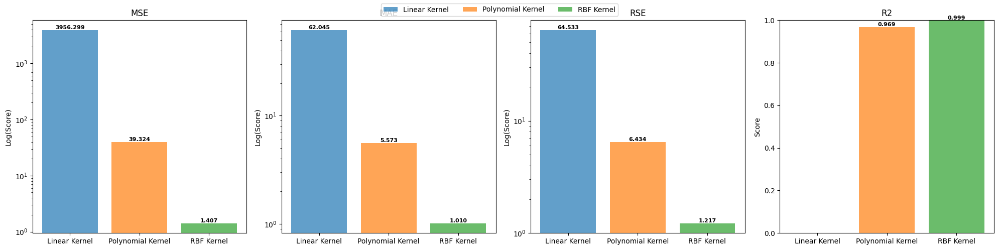

In [63]:
scores = {
    'Linear Kernel': [mse_linear, mae_linear, rse_linear, r2_linear],
    'Polynomial Kernel': [mse_polynomial, mae_polynomial, rse_polynomial, r2_polynomial],
    'RBF Kernel': [mse_rbf, mae_rbf, rse_rbf, r2_rbf]
}
x = range(len(metrics))

fig, axs = plt.subplots(1, 4, figsize=(20, 5))

# Plot MSE, MAE, and RSE with a logarithmic scale
for i, metric in enumerate(metrics[:-1]):
  axs[i].set_yscale('log')
  for model in scores:
    bar = axs[i].bar(model, scores[model][i], alpha=0.7, label=model)
    for b in bar:
        height = b.get_height()
        axs[i].text(b.get_x() + b.get_width() / 2., height, '{:.3f}'.format(height),
                    ha='center', va='bottom', fontsize=8, weight='bold')

  axs[i].set_title(metric)
  axs[i].set_ylabel('Log(Score)')

# Plot R2 in a regular scale
axs[3].set_ylim(0, 1)
for model in scores:
  bar = axs[3].bar(model, scores[model][3], alpha=0.7, label=model)
  if model != 'Linear Kernel':
    for b in bar:
      height = b.get_height()
      axs[3].text(b.get_x() + b.get_width() / 2., height, '{:.3f}'.format(height),
                  ha='center', va='bottom', fontsize=8, weight='bold')

axs[3].set_title('R2')
axs[3].set_ylabel('Score')

handles, labels = axs[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', ncol=len(scores))
plt.tight_layout()
plt.show()